<a href="https://colab.research.google.com/github/LokeshPanuganti15/Python/blob/main/Wine_clustering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

*   mention about problem statement
*   talk about columns
*   install the models and requried libraries
*   load dataset
*   understand your data
*   EDA
1.   univariate
2.   multivariate
*   check the null values or missing values
1.   treating the null values(fill with mean or median or mode)
2.   drop null values if they are less than 5%-10%
*   check the duplicates
1.   drop the duplicates
*   treating the outliers
1.   check the outliers
2.   remove the outliers
3.   make the box plot before and after the outliers
*   feature engineering
* a. 1.   extract the features
2.   create the features
3.   select the features
* b.   makingthe multicoliniarity
1.   heat map
2.   vif technique
* c.   transformation



First 5 rows:
   Alcohol  Malic_Acid   Ash  Ash_Alcanity  Total_Phenols  Flavanoids  \
0    14.05        3.24  2.20          18.3           1.04        3.89   
1    13.00        3.20  2.49          16.5           2.46        1.92   
2    11.90        2.98  2.32          20.1           3.13        1.72   
3    11.89        1.36  2.51          21.0           1.63        2.57   
4    13.15        1.89  2.47          26.0           1.30        3.83   

   Nonflavanoid_Phenols  Proanthocyanins  Color_Intensity   Hue  OD280  \
0                  0.51             2.37             7.43  0.80   2.46   
1                  0.22             0.83             1.98  1.07   4.34   
2                  0.45             1.02             4.54  0.83   0.67   
3                  0.16             0.94             8.49  0.83   3.46   
4                  0.34             1.38             3.07  0.97   2.80   

   Magnesium  Proline  
0         90      352  
1        104      813  
2         90      199  
3     

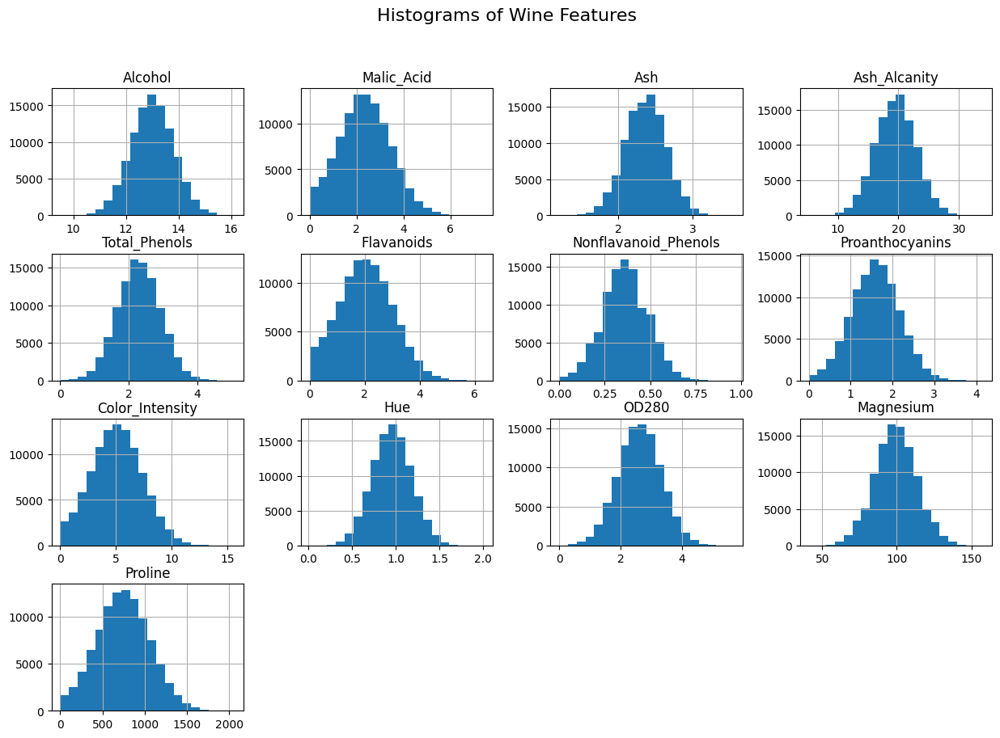

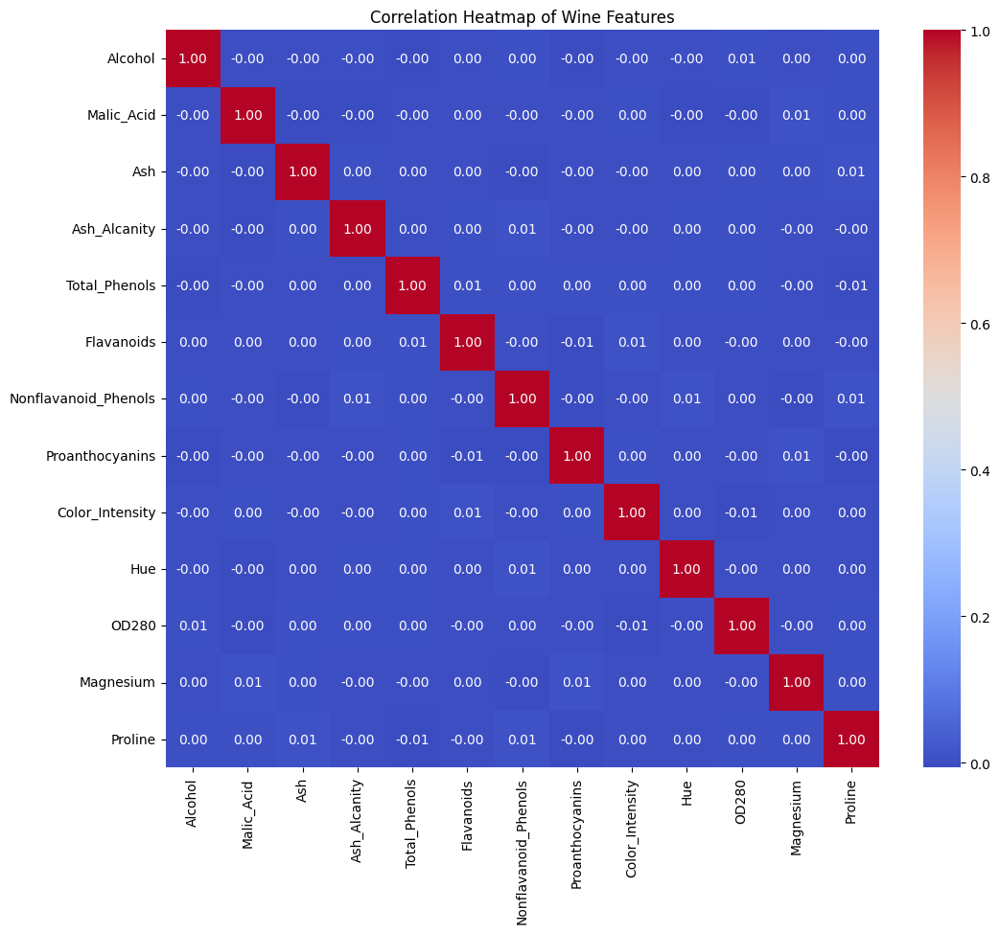

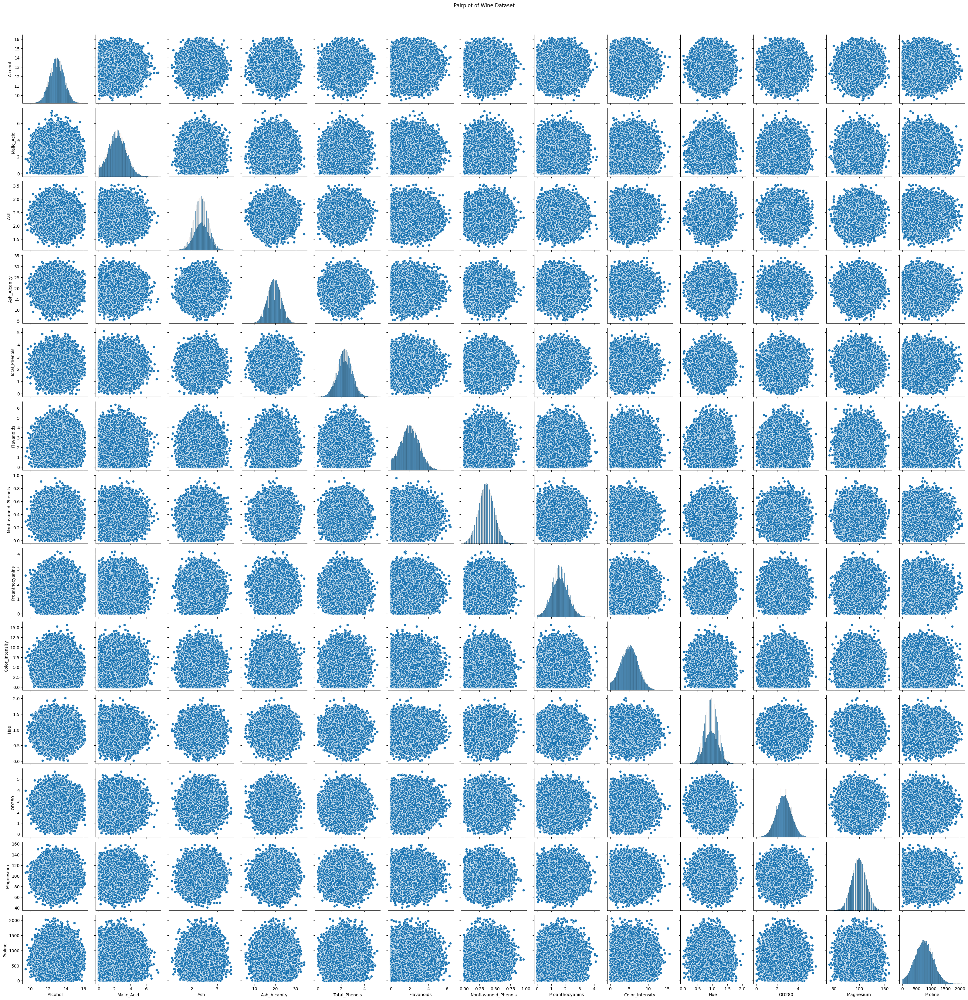

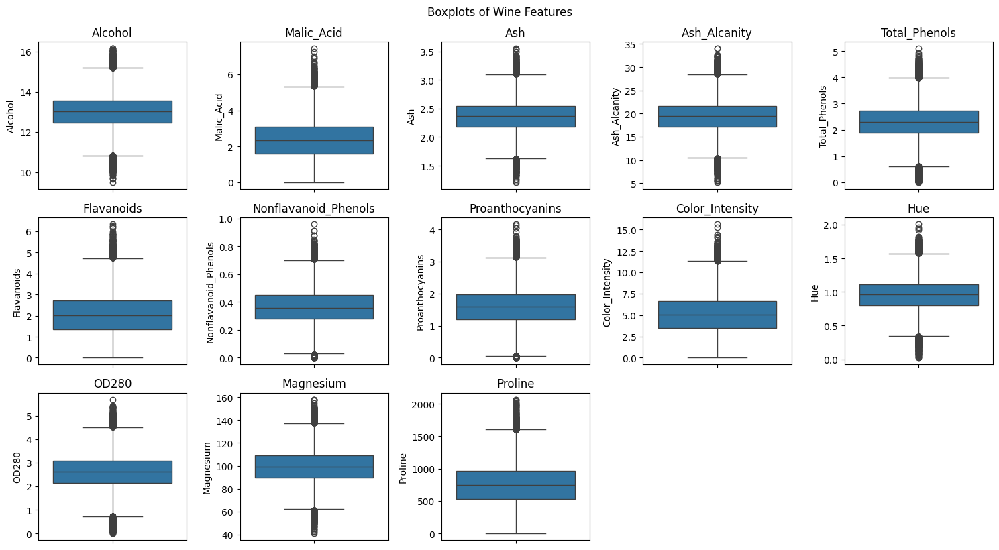

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1 Data Understanding
file_path = "wine-clustering.csv"
df = pd.read_csv(r"/content/wine-clustering.csv")

print("First 5 rows:")
print(df.head())
print("\nLast 5 rows:")
print(df.tail())

print("\nData Info:")
print(df.info())
print("\nData Description:")
print(df.describe())

print("\nData Shape:")
print(df.shape)

# 2. Data Cleaning
print("\nMissing Values:")
print(df.isnull().sum())

print("\nDuplicate Rows:")
duplicates = df.duplicated().sum()
print(duplicates)

if duplicates > 0:
    df = df.drop_duplicates()
    print("Duplicates removed. New shape:", df.shape)

# 3. Exploratory Data Analysis (EDA)
df.hist(figsize=(15, 10), bins=20)
plt.suptitle("Histograms of Wine Features", fontsize=16)
plt.show()

# Correlation heatmap
plt.figure(figsize=(12, 10))
corr = df.corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Heatmap of Wine Features")
plt.show()

# Pairplot
sns.pairplot(df)
plt.suptitle("Pairplot of Wine Dataset", y=1.02)
plt.show()

# Boxplots
plt.figure(figsize=(15, 8))
for i, column in enumerate(df.columns, 1):
    plt.subplot(3, 5, i)
    sns.boxplot(y=df[column])
    plt.title(column)
plt.tight_layout()
plt.suptitle("Boxplots of Wine Features", y=1.02)
plt.show()

In [ ]:
df.shape

(100000, 13)

In [ ]:
df.duplicated().sum()

0

In [ ]:
df.head()

,Alcohol,Malic_Acid,Ash,Ash_Alcanity,Total_Phenols,Flavanoids,Nonflavanoid_Phenols,Proanthocyanins,Color_Intensity,Hue,OD280,Magnesium,Proline
0,14.05,3.24,2.20,18.3,1.04,3.89,0.51,2.37,7.43,0.80,2.46,90,352
1,13.00,3.20,2.49,16.5,2.46,1.92,0.22,0.83,1.98,1.07,4.34,104,813
2,11.90,2.98,2.32,20.1,3.13,1.72,0.45,1.02,4.54,0.83,0.67,90,199
3,11.89,1.36,2.51,21.0,1.63,2.57,0.16,0.94,8.49,0.83,3.46,86,820
4,13.15,1.89,2.47,26.0,1.30,3.83,0.34,1.38,3.07,0.97,2.80,108,1188


In [ ]:
df.isnull().sum()

,0
Alcohol,0
Malic_Acid,0
Ash,0
Ash_Alcanity,0
Total_Phenols,0
Flavanoids,0
Nonflavanoid_Phenols,0
Proanthocyanins,0
Color_Intensity,0
Hue,0


In [ ]:
import pandas as pd
import numpy as np

def remove_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    df_filtered = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]
    return df_filtered
for column in df.columns:
    if pd.api.types.is_numeric_dtype(df[column]):
        df = remove_outliers_iqr(df, column)

print(df.shape)


(92769, 13)


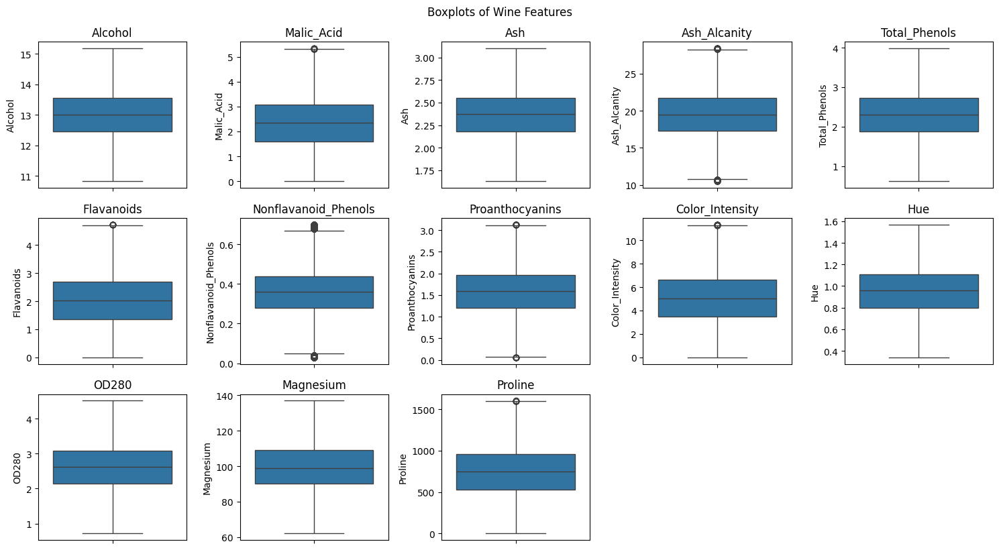

In [ ]:
plt.figure(figsize=(15, 8))
for i, column in enumerate(df.columns, 1):
    plt.subplot(3, 5, i)
    sns.boxplot(y=df[column])
    plt.title(column)
plt.tight_layout()
plt.suptitle("Boxplots of Wine Features", y=1.02)
plt.show()

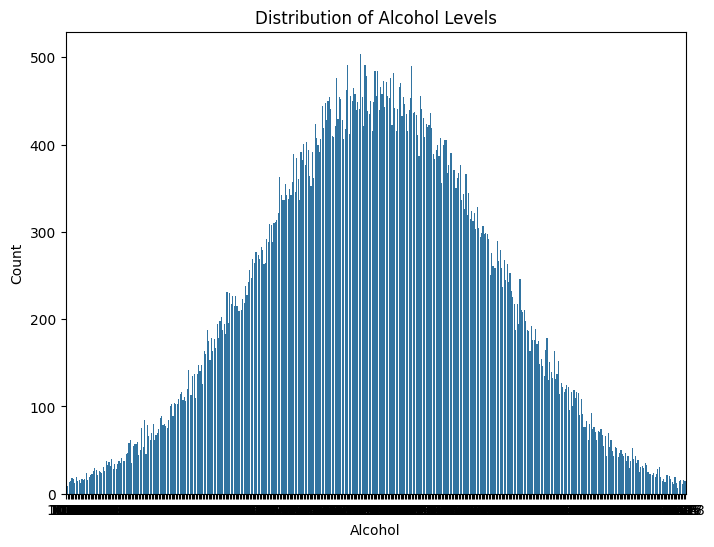

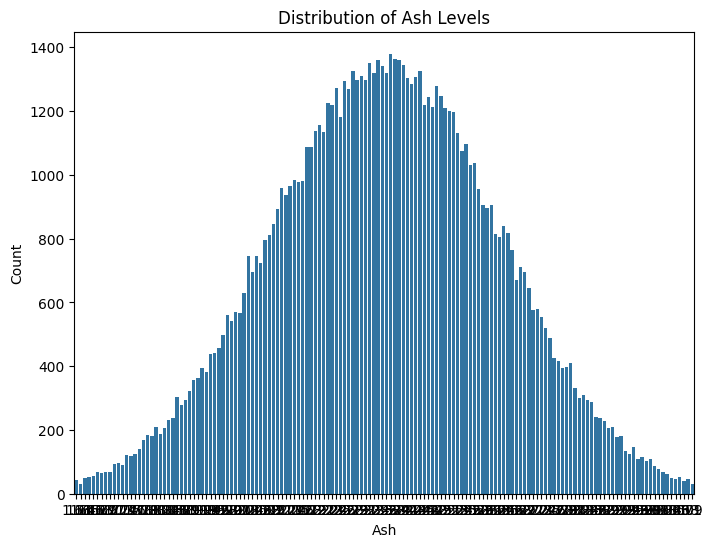

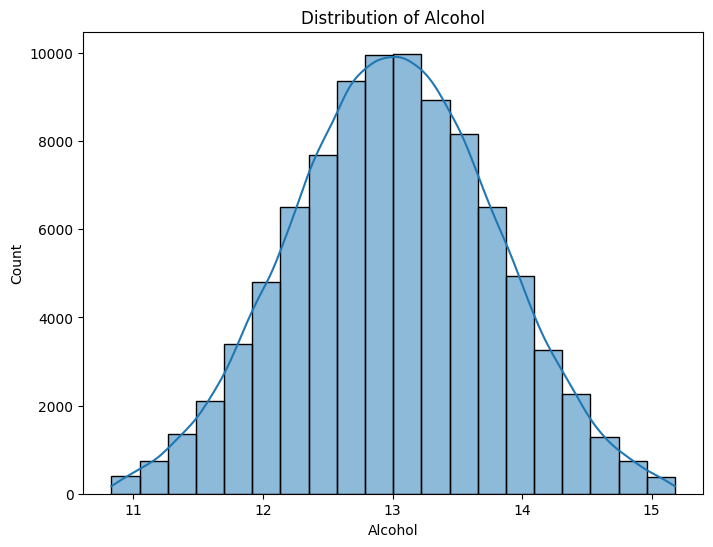

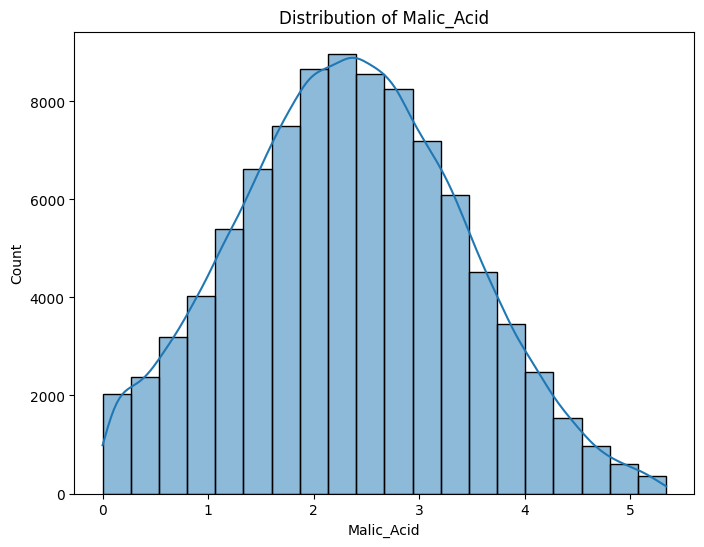

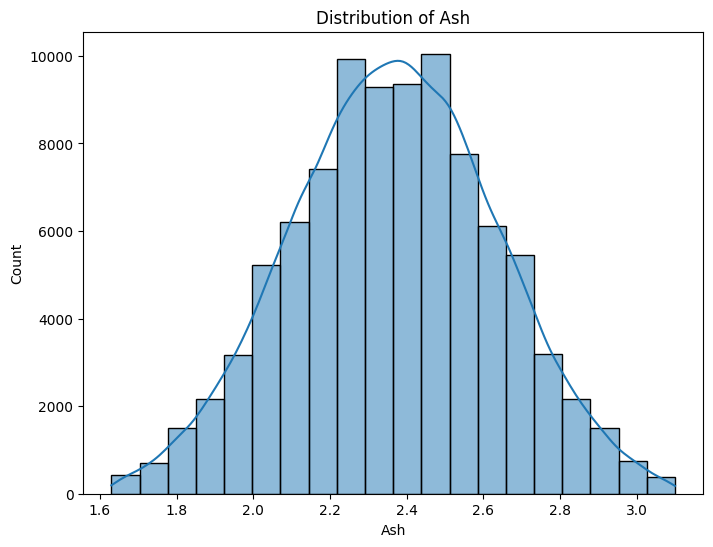

...

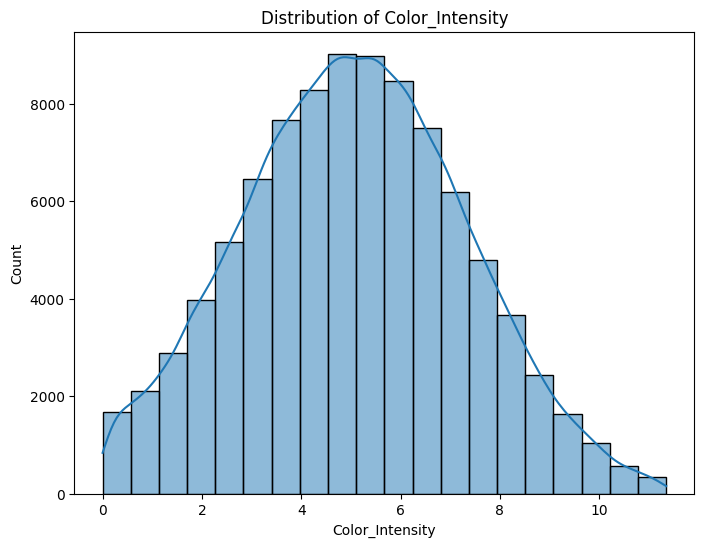

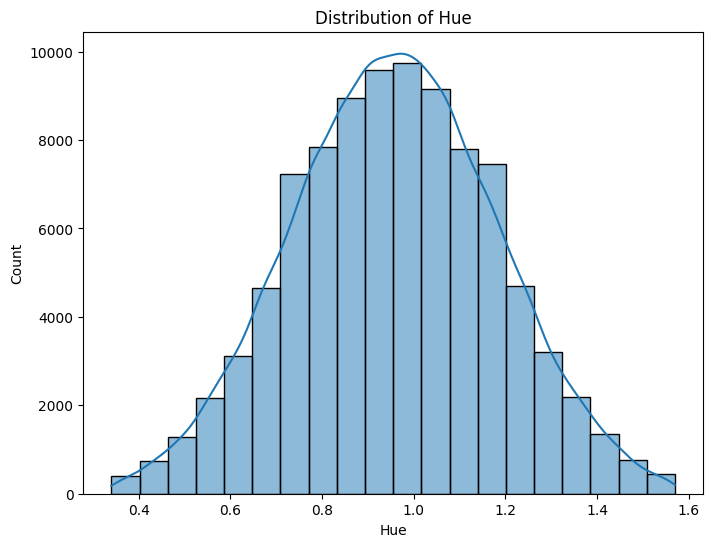

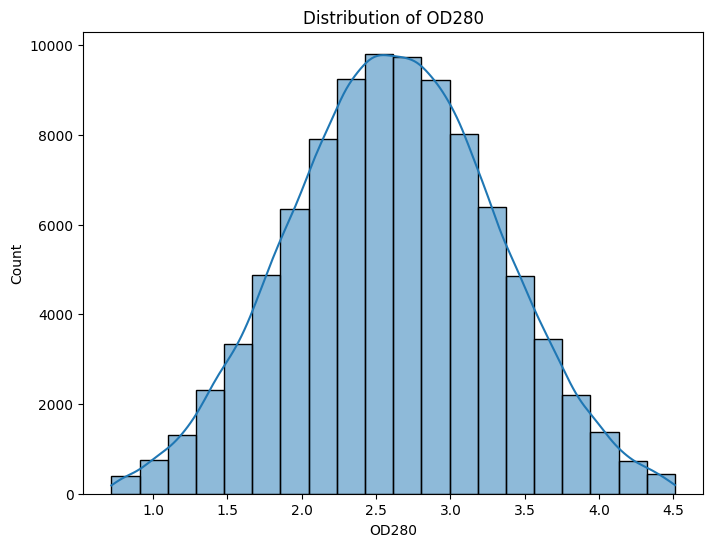

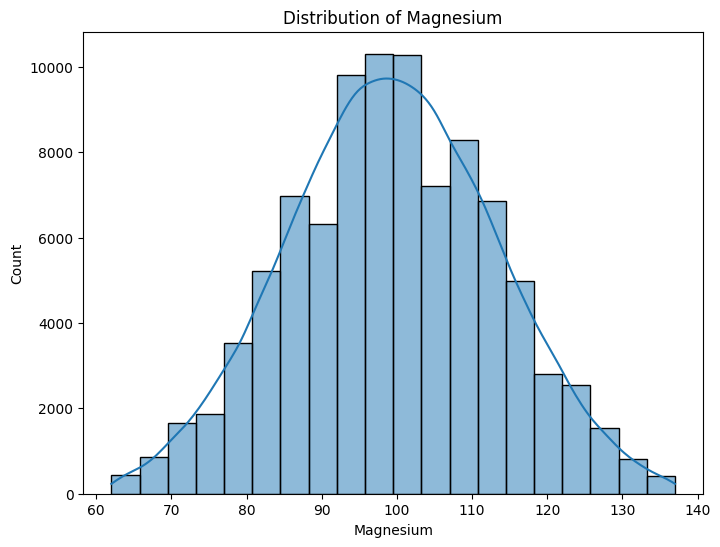

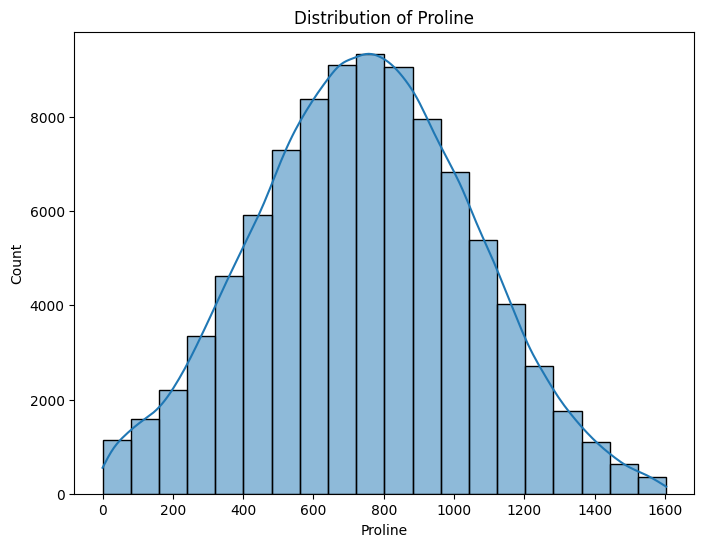

In [ ]:
# prompt: bar graphs

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df is already defined and preprocessed as in the provided code.
# If not, please include the code to load and preprocess your data.

# Bar plot for the 'Alcohol' column (example)
plt.figure(figsize=(8, 6))
sns.countplot(x='Alcohol', data=df)  # Use countplot for categorical or discrete data
plt.title('Distribution of Alcohol Levels')
plt.xlabel('Alcohol')
plt.ylabel('Count')
plt.show()


# Example using a different column (replace 'Ash' with your desired column)
plt.figure(figsize=(8, 6))
sns.countplot(x='Ash', data=df)
plt.title('Distribution of Ash Levels')
plt.xlabel('Ash')
plt.ylabel('Count')
plt.show()

#If you have a truly categorical variable (e.g., a column called 'WineType' with categories like 'Red', 'White', 'Rose')
#then a bar plot showing the counts of each wine type would be more suitable:
# plt.figure(figsize=(8, 6))
# sns.countplot(x='WineType', data=df)
# plt.title('Distribution of Wine Types')
# plt.xlabel('Wine Type')
# plt.ylabel('Count')
# plt.show()

#To make bar plots for all columns, you can iterate over them:

for col in df.columns:
  if pd.api.types.is_numeric_dtype(df[col]):
    plt.figure(figsize=(8,6))
    sns.histplot(df[col], bins=20, kde=True)
    plt.title(f'Distribution of {col}')
    plt.show()
  else:
    plt.figure(figsize=(8,6))
    sns.countplot(x=col, data = df)
    plt.title(f'Distribution of {col}')
    plt.show()


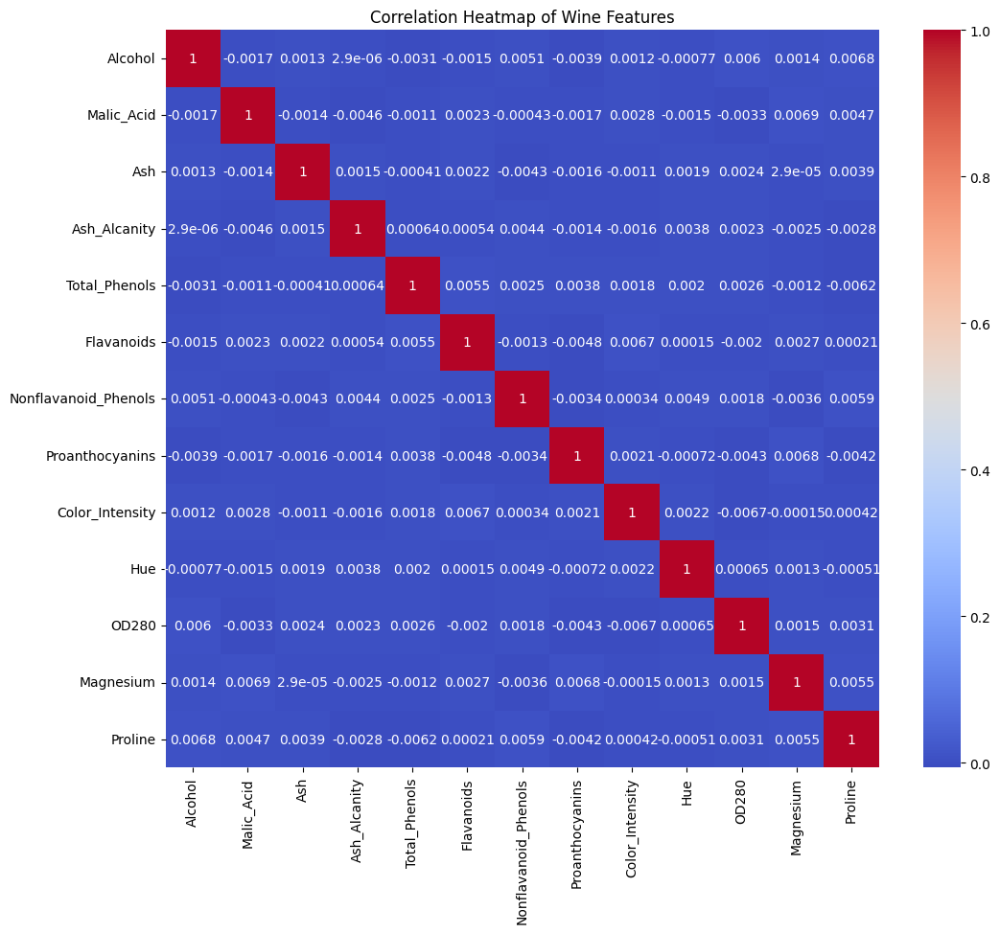

In [ ]:
# prompt: heatmap

import matplotlib.pyplot as plt
# Correlation heatmap
plt.figure(figsize=(12, 10))
corr = df.corr()
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title("Correlation Heatmap of Wine Features")
plt.show()

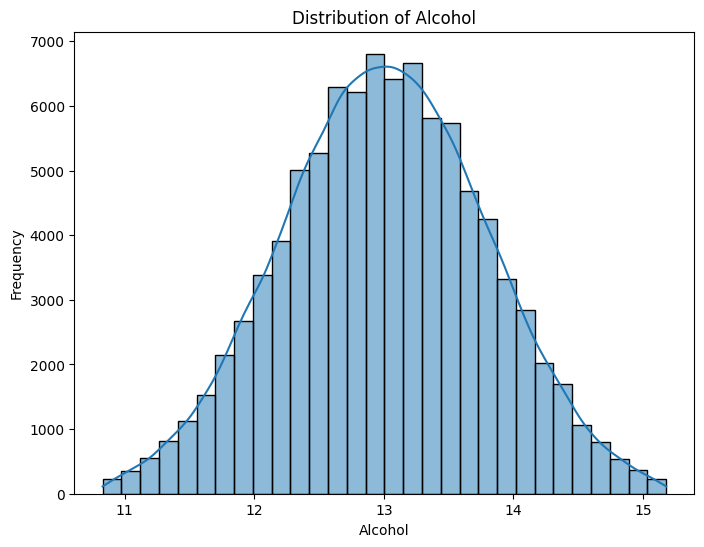

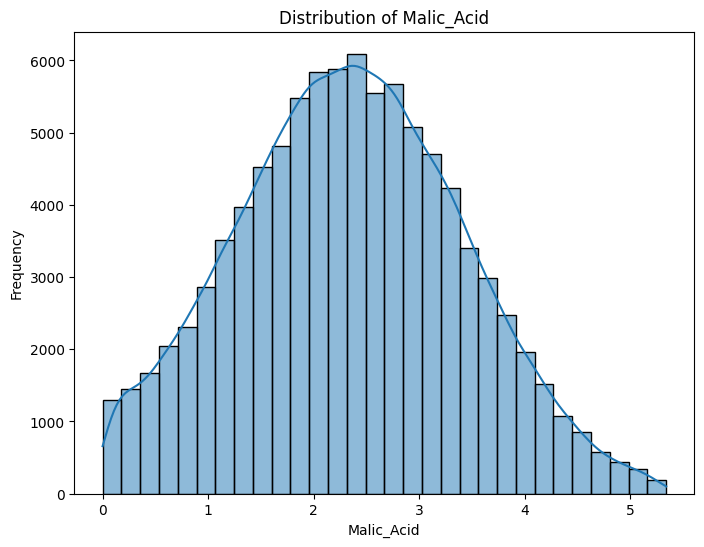

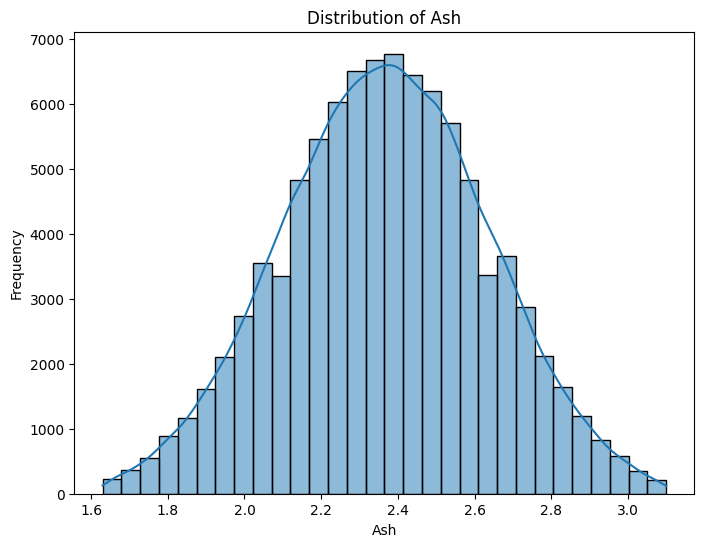

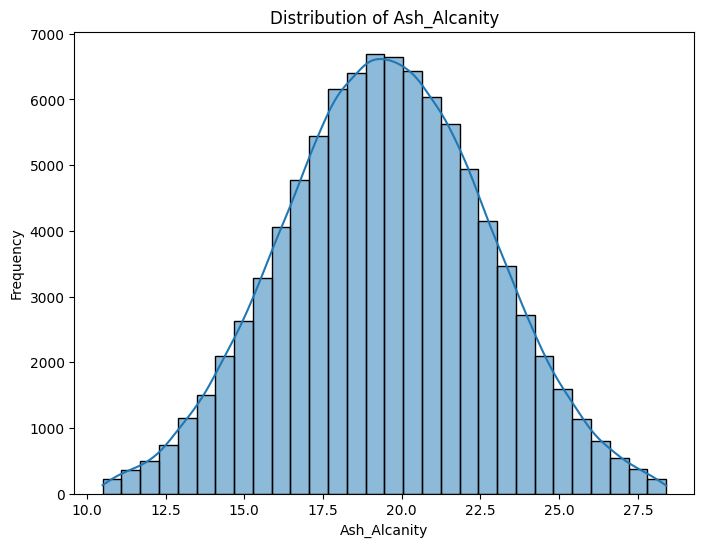

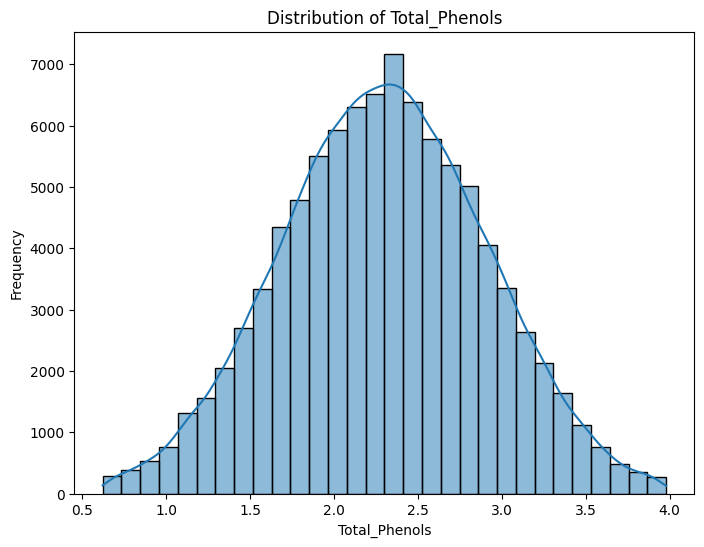

...

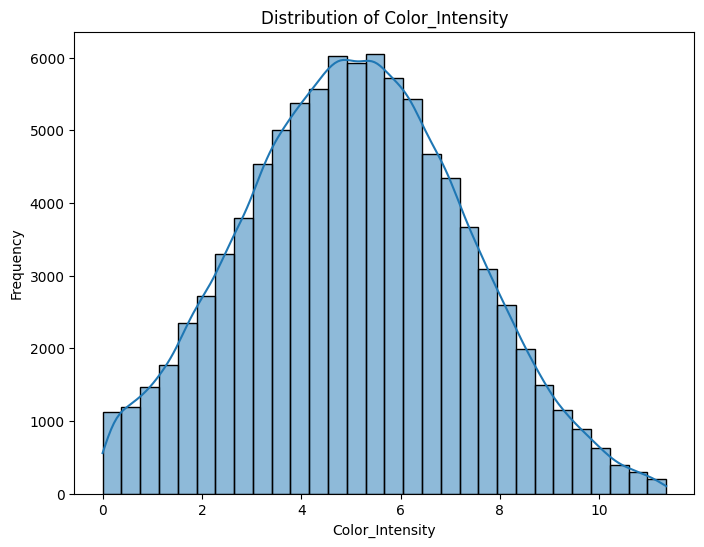

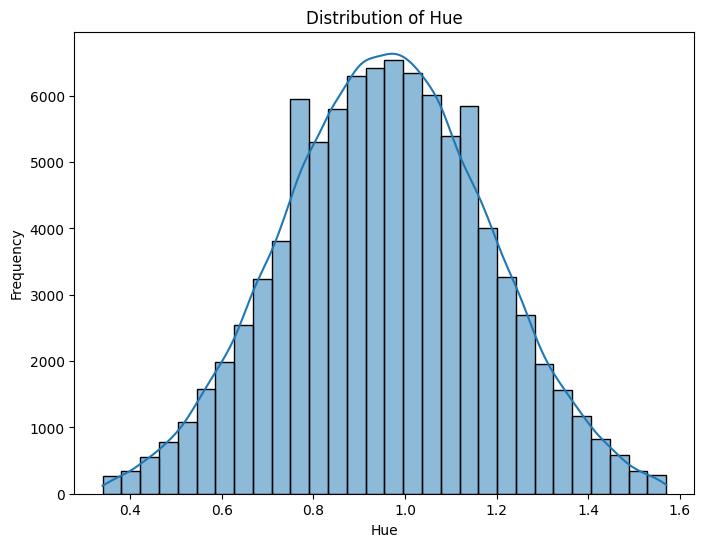

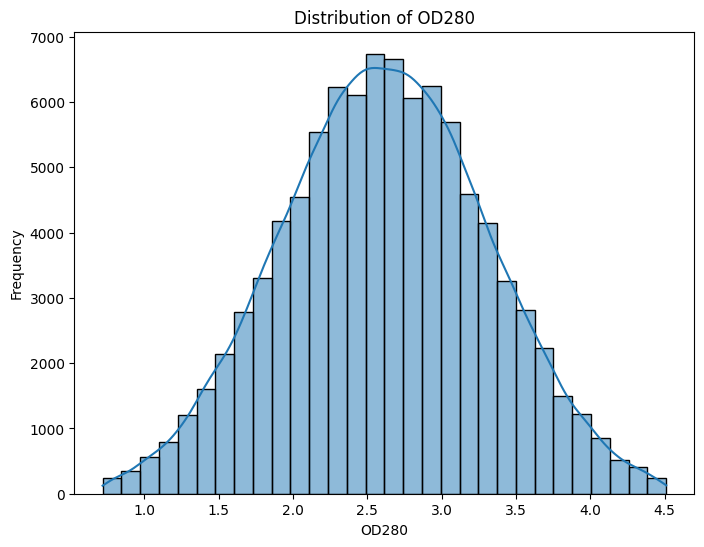

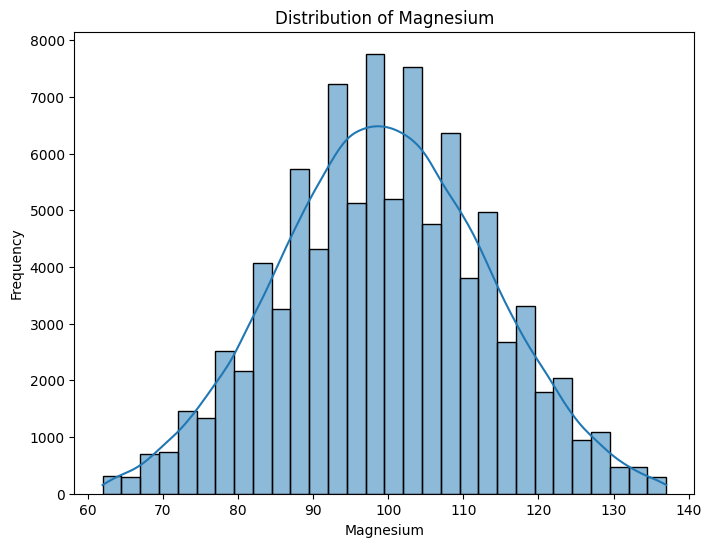

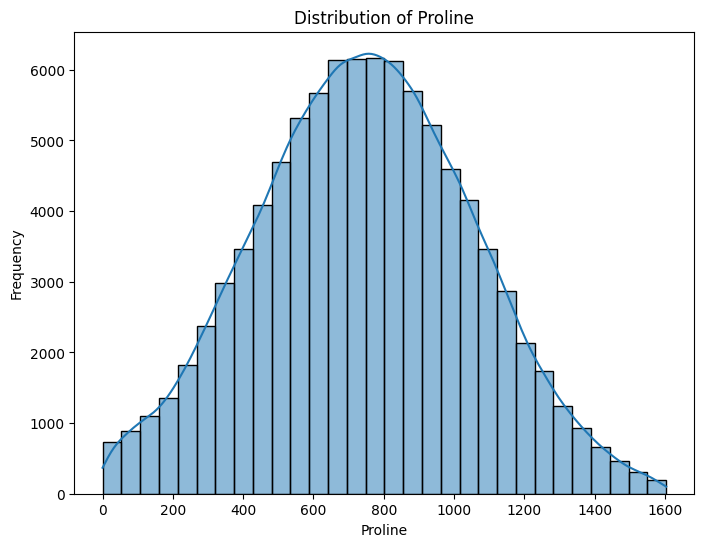

In [ ]:
# prompt: univareant graphs

import pandas as pd
import matplotlib.pyplot as plt
# Assuming df is already defined and preprocessed as in the provided code.
# If not, please include the code to load and preprocess your data.

# Improved univariate analysis with better visualization choices

for col in df.columns:
    if pd.api.types.is_numeric_dtype(df[col]):
        plt.figure(figsize=(8, 6))
        sns.histplot(df[col], bins=30, kde=True)  # Increased bins for better granularity
        plt.title(f'Distribution of {col}')
        plt.xlabel(col)
        plt.ylabel('Frequency')
        plt.show()

    else:  # For categorical/discrete variables
        plt.figure(figsize=(8, 6))
        value_counts = df[col].value_counts()  # Get value counts
        plt.bar(value_counts.index, value_counts.values)
        plt.title(f'Distribution of {col}')
        plt.xlabel(col)
        plt.ylabel('Count')
        plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
        plt.show()

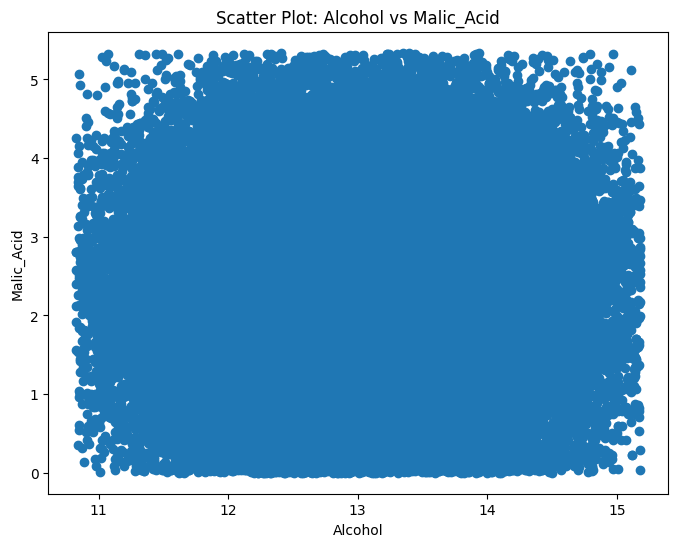

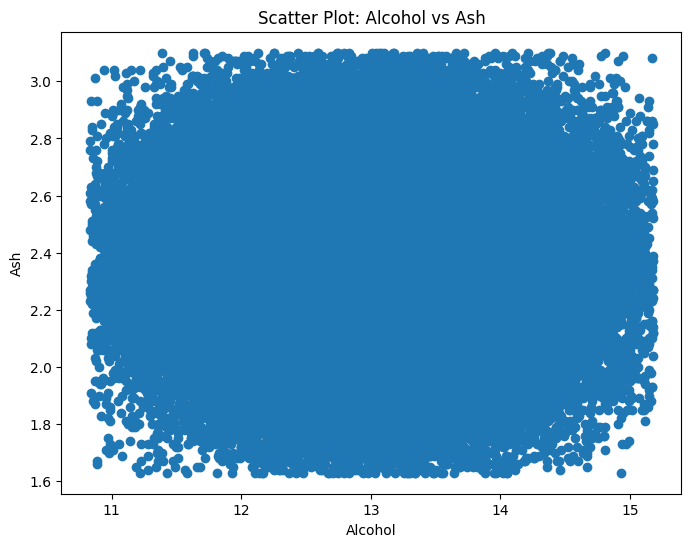

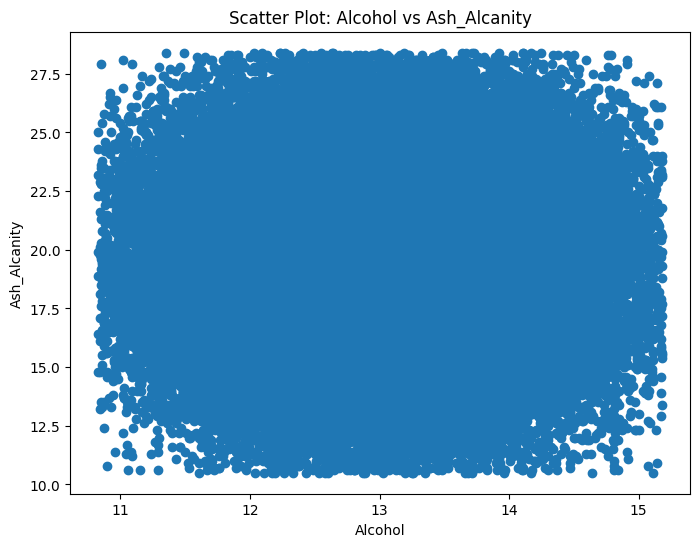

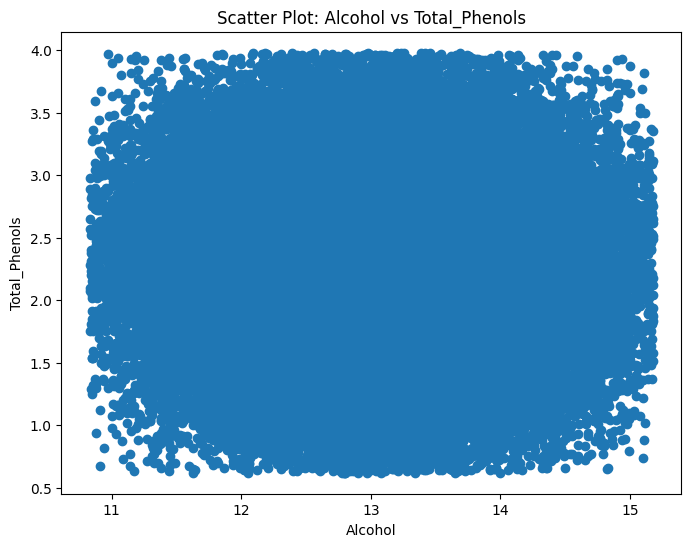

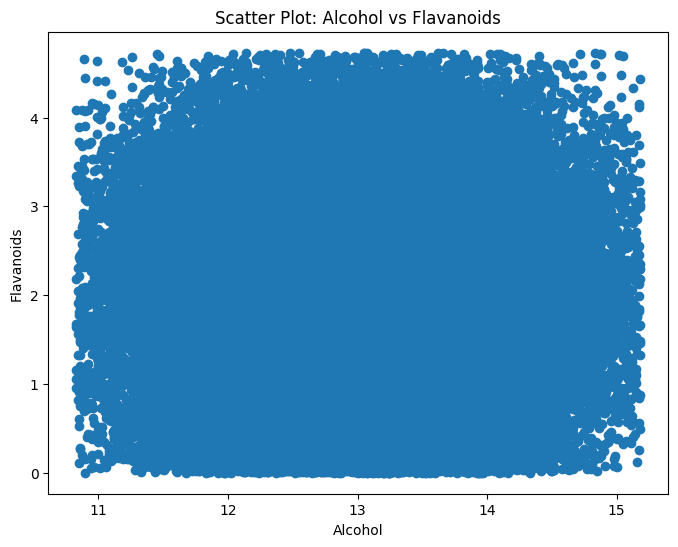

...

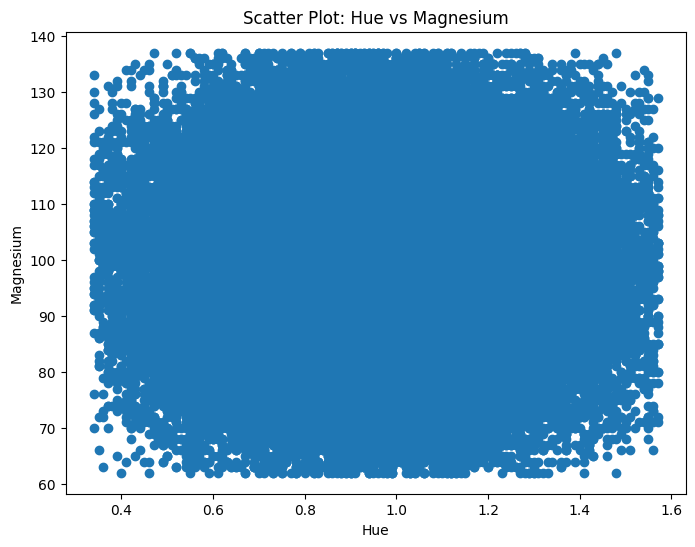

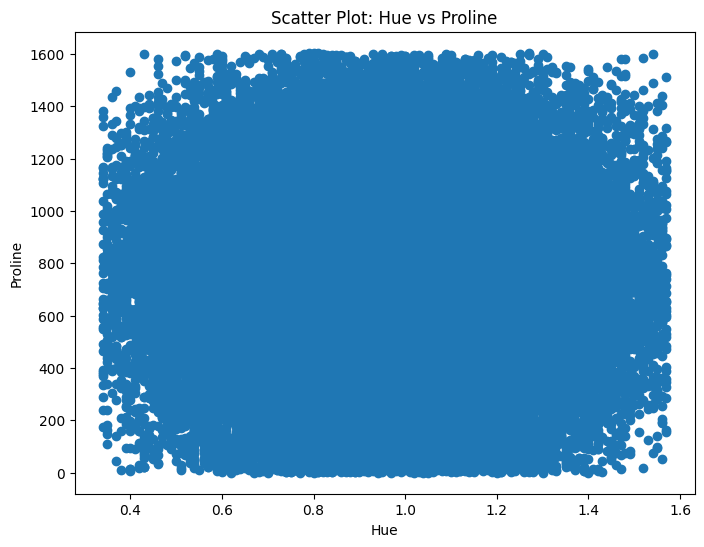

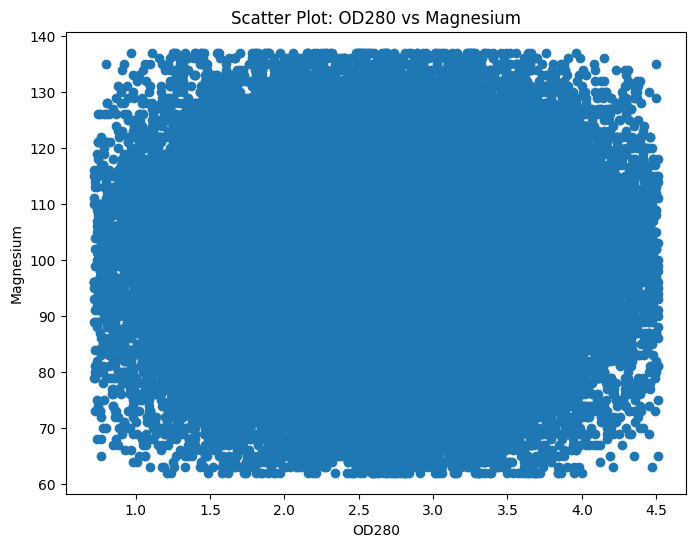

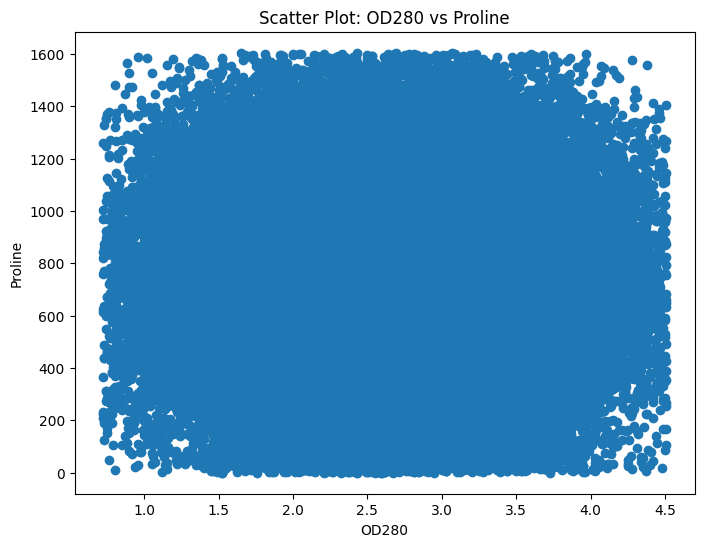

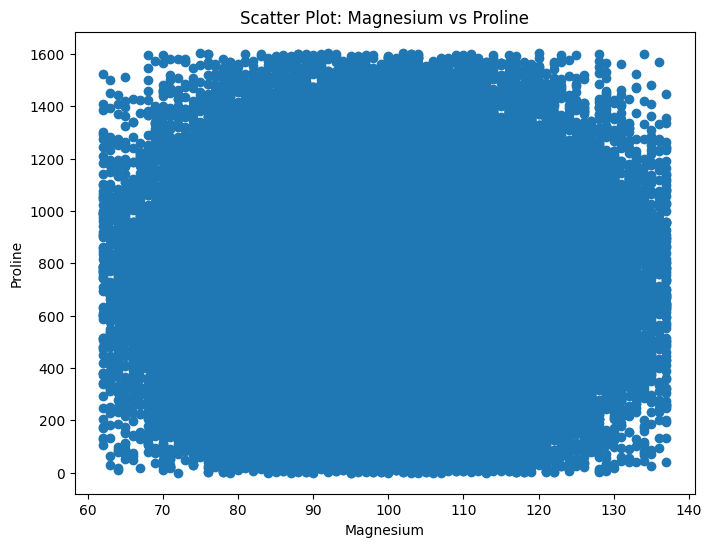

In [ ]:
# prompt: scatter plots

import pandas as pd
import matplotlib.pyplot as plt
# Scatter plots for all pairs of numerical features
for i in range(len(df.columns)):
    for j in range(i + 1, len(df.columns)):
        if pd.api.types.is_numeric_dtype(df.iloc[:, i]) and pd.api.types.is_numeric_dtype(df.iloc[:, j]):
            plt.figure(figsize=(8, 6))
            plt.scatter(df.iloc[:, i], df.iloc[:, j])
            plt.xlabel(df.columns[i])
            plt.ylabel(df.columns[j])
            plt.title(f'Scatter Plot: {df.columns[i]} vs {df.columns[j]}')
            plt.show()

<ipython-input-13-98f55b4a1868>:9: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for KDE


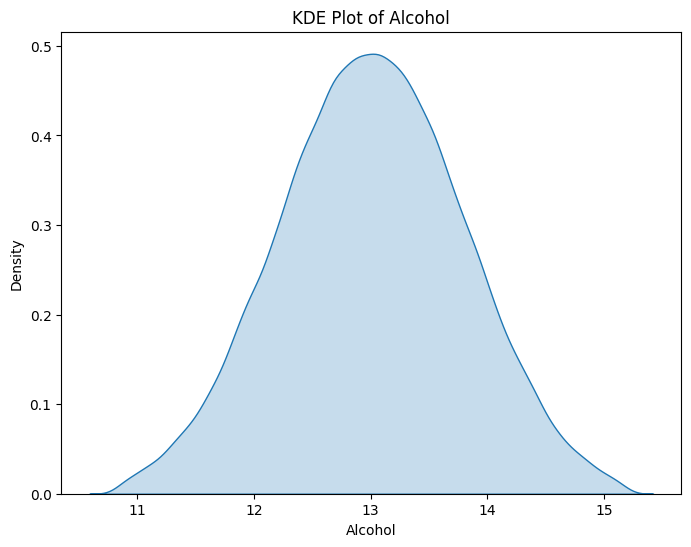

<ipython-input-13-98f55b4a1868>:9: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for KDE


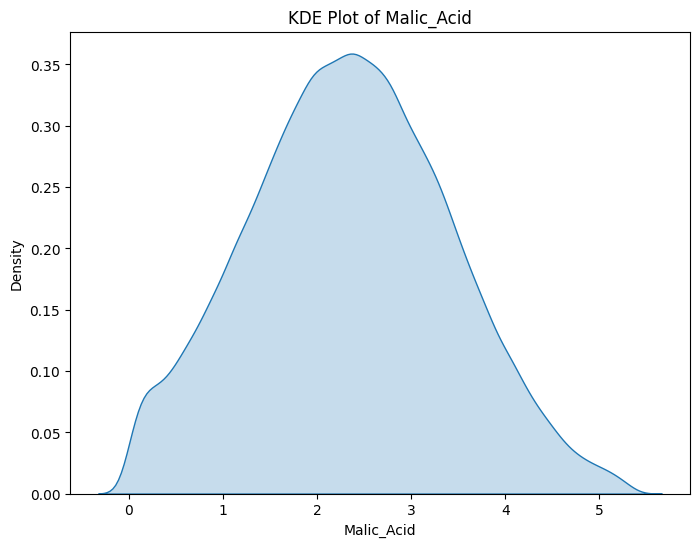

<ipython-input-13-98f55b4a1868>:9: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for KDE


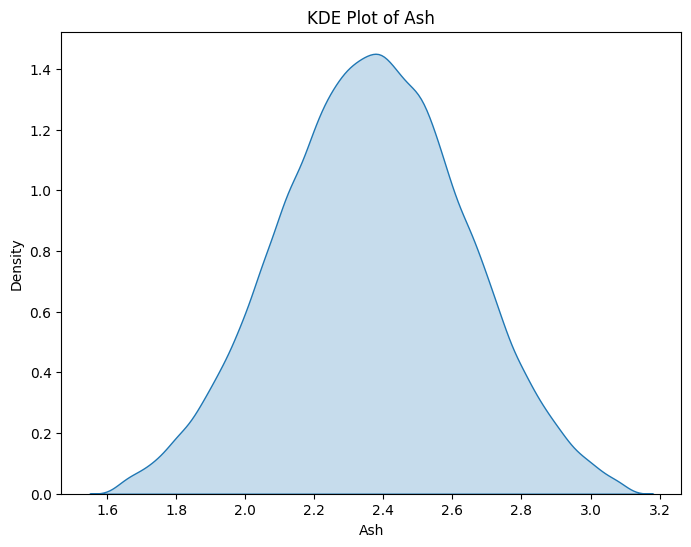

<ipython-input-13-98f55b4a1868>:9: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for KDE


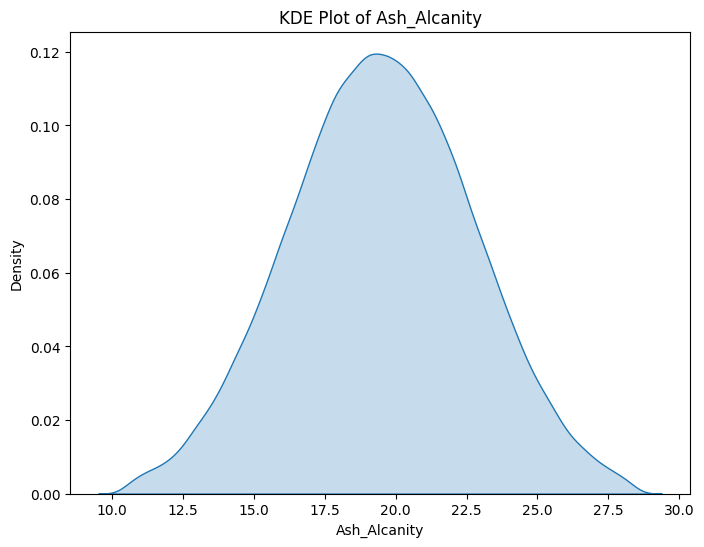

<ipython-input-13-98f55b4a1868>:9: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for KDE


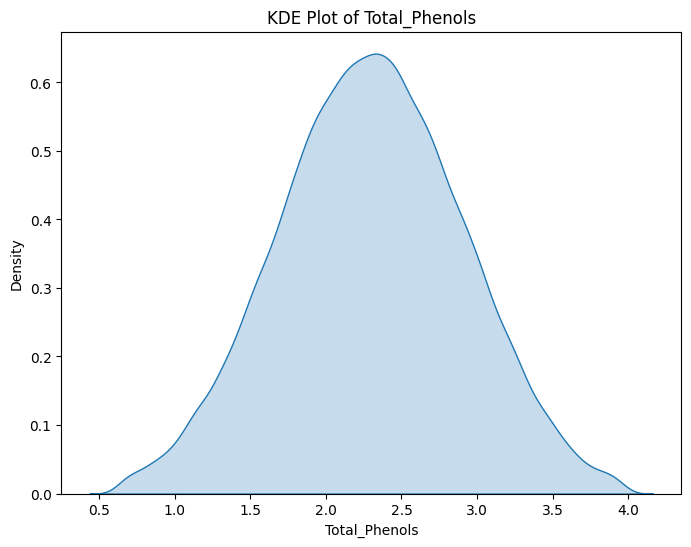

<ipython-input-13-98f55b4a1868>:9: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for KDE


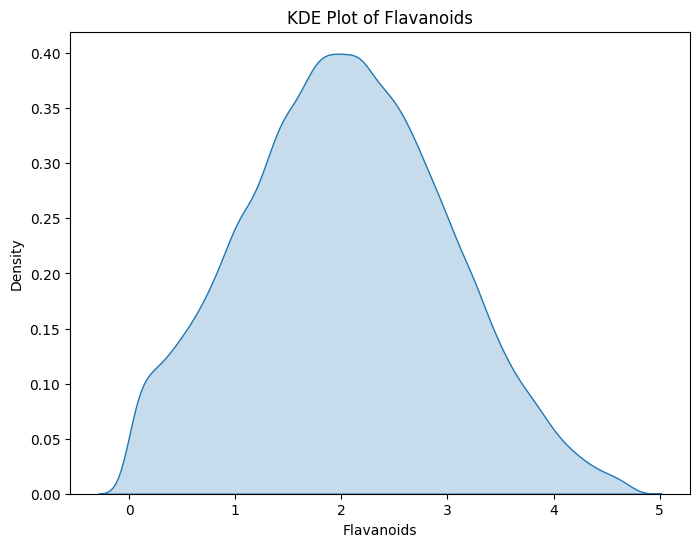

<ipython-input-13-98f55b4a1868>:9: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for KDE


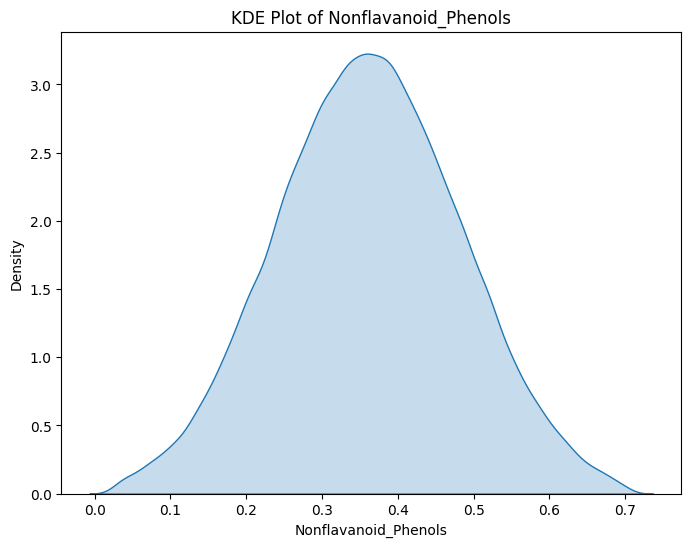

<ipython-input-13-98f55b4a1868>:9: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for KDE


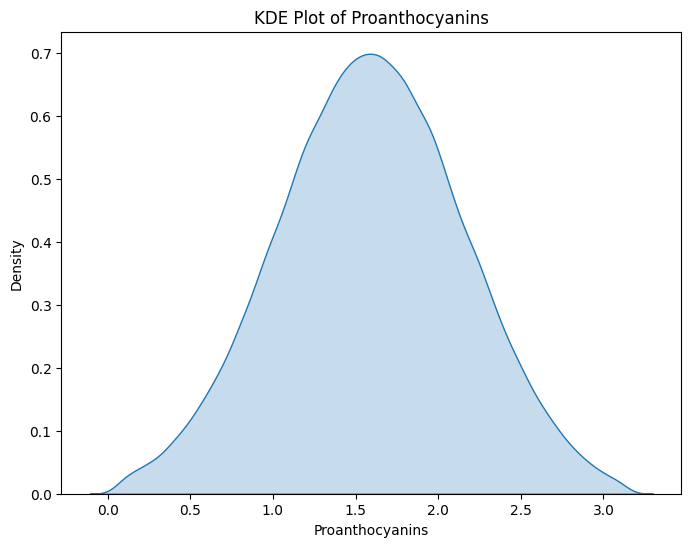

<ipython-input-13-98f55b4a1868>:9: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for KDE


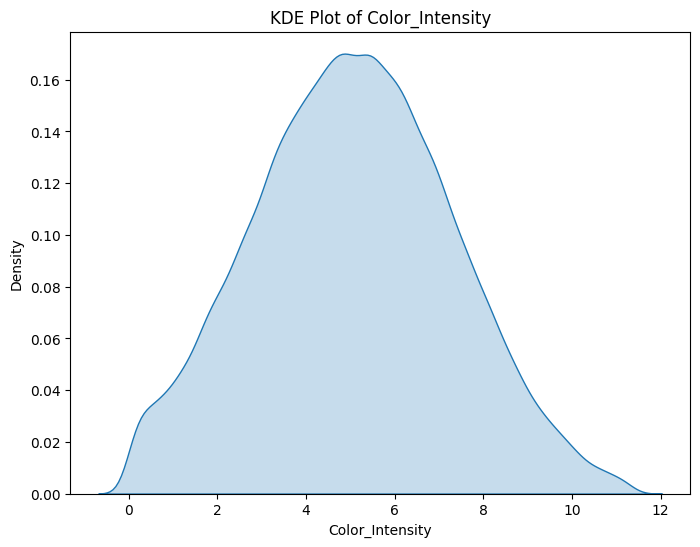

<ipython-input-13-98f55b4a1868>:9: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for KDE


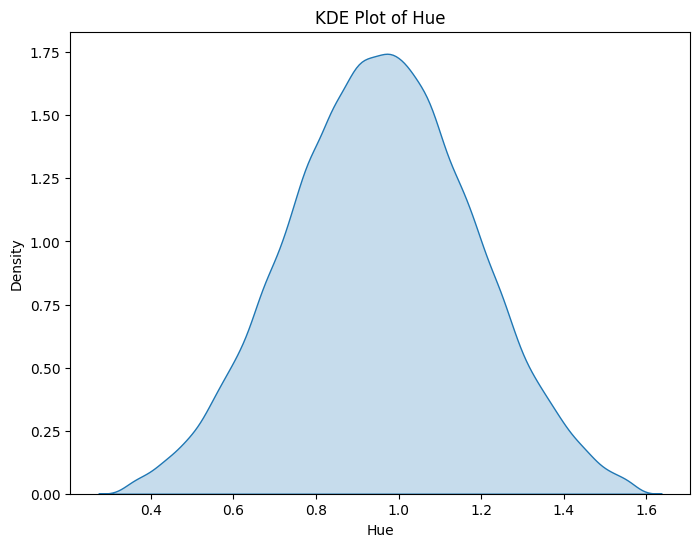

<ipython-input-13-98f55b4a1868>:9: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for KDE


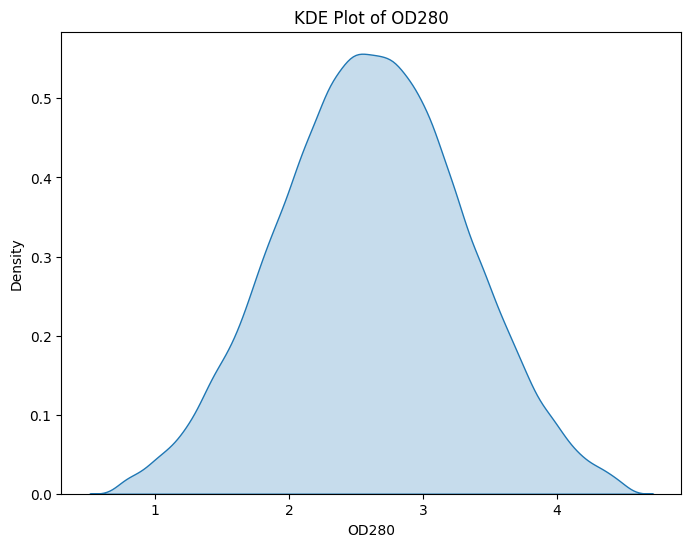

<ipython-input-13-98f55b4a1868>:9: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for KDE


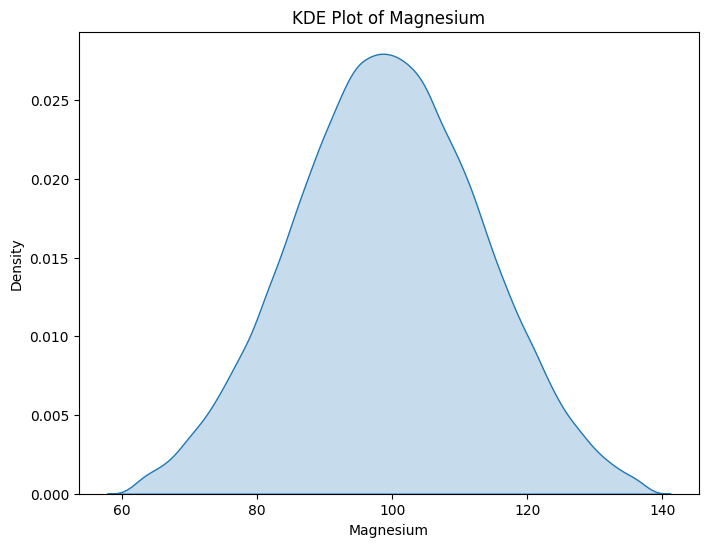

<ipython-input-13-98f55b4a1868>:9: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)  # Use kdeplot for KDE


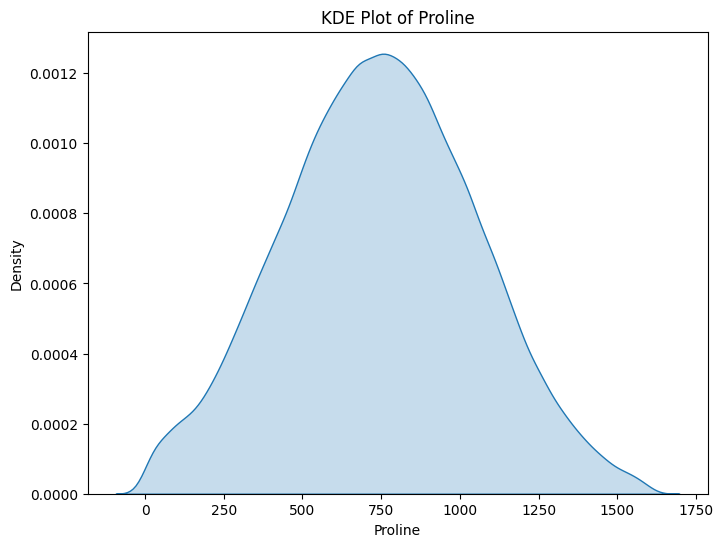

In [ ]:
# prompt: kde plots

import pandas as pd
import matplotlib.pyplot as plt
# KDE plots for all numerical columns
for col in df.columns:
    if pd.api.types.is_numeric_dtype(df[col]):
        plt.figure(figsize=(8, 6))
        sns.kdeplot(df[col], shade=True)  # Use kdeplot for KDE
        plt.title(f'KDE Plot of {col}')
        plt.xlabel(col)
        plt.ylabel('Density')
        plt.show()

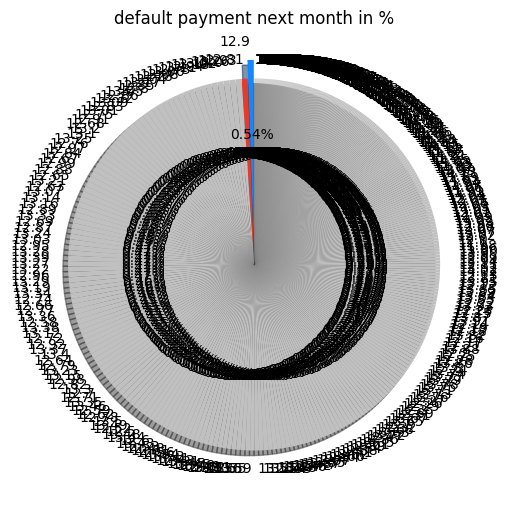

In [ ]:
percentage = df['Alcohol'].value_counts(normalize=True) * 100
labels = percentage.index
# Create an explode list with the same length as percentage, with 0.1 for the first slice (to highlight it) and 0 for the rest
explode = [0.1] + [0] * (len(percentage) - 1)

# Plot PieChart
fig, ax = plt.subplots(figsize=(6, 8))
colors = ['#1188ff', '#e63a2a'] + ['#c0c0c0'] * (len(percentage) - 2)  # Adjust colors as needed
plt.title("default payment next month in %")
ax.pie(percentage, labels=labels, startangle=90, autopct='%1.2f%%', explode=explode, shadow=True, colors=colors)
plt.show()